In [356]:
import matplotlib.pyplot as plt
import matplotlib.collections
from matplotlib.collections import EllipseCollection
from matplotlib.colors import LinearSegmentedColormap
import matplotlib as mpl
import matplotlib.animation as animation
plt.style.use(['dark_background'])

import numpy as np

from scipy.optimize import curve_fit

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import StratifiedKFold as KFold
from keras.utils import to_categorical 

In [357]:
X,Y = np.array([]), np.array([])
for n,r in zip([4,6, 6,8,16, 20,28,36, 28,40,48,], [6,8, 36,37,40, 70,76,84, 120,115,130,]):
    th = np.linspace(0, 2*np.pi, n+1)[:-1]
    X  = np.concatenate((X, r*np.cos(th)))
    Y  = np.concatenate((Y, r*np.sin(th)))

In [379]:
# d = np.load(r"C:\Users\zfj\data\marre_lab\Multispot_MEA_data_10^5.npy", allow_pickle=True).item()
d = np.load(r"C:\Users\zfj\data\marre_lab\Multispot_MEA_data_10^6.npy", allow_pickle=True).item()


In [359]:
def gauss2(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, offset):
    # x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = offset + amplitude*np.exp( - (a*((xy[0]-xo)**2) + 2*b*(xy[0]-xo)*(xy[1]-yo) 
                            + c*((xy[1]-yo)**2)))
    return g.ravel()

In [360]:
def fit(X, Y, Z, bounds=None):
    cx = X[np.argmax(Z)]
    cy = Y[np.argmax(Z)]

    # print(cx,cy, Z.min(), Z.max() - Z.min(), Z.std())

    if bounds is not None:
        sx = max(Z.std(), bounds[0][3])
        sy = max(Z.std(), bounds[0][4])    
    else:    
        sx = sy = Z.std()    

    try:
        popt, _ = curve_fit(gauss2, (X, Y), Z, p0=(Z.max() - Z.min(),cx,cy,sx,sy,0,Z.min()), bounds=bounds, maxfev=10000)
        f = gauss2((X,Y), *popt)
    except RuntimeError:
        f = None

    return f, popt

In [380]:
mn, mx = np.infty, -np.infty

for i,ci in enumerate(d.keys()):
    for j in range(len(d[ci])):
        for k, st in enumerate(d[ci][j]['spike_trains']):
            if len(st):
                if st.min() < mn:
                    mn = st.min()
                if st.max() > mx:
                    mx = st.max()
print(mn, mx)
print(len(list(d.keys())))

-0.125 0.8500000000003638
214


In [381]:

ncells = len(list(d.keys()))
nt = 5
ti = np.linspace(mn,mx,nt+1)

nreps = 30
ntrials = nreps * len(X) #30 repeats * 240 locations = 7200 trials!
psth = np.empty((ntrials, ncells, nt)) * np.nan


for i,ci in enumerate(d.keys()):
    for j in range(len(d[ci])):
        for k, st in enumerate(d[ci][j]['spike_trains']):
            for t in range(nt):
                psth[k+nreps*j, i, t] = np.count_nonzero(np.logical_and(st>=ti[t], st<ti[t+1]))    

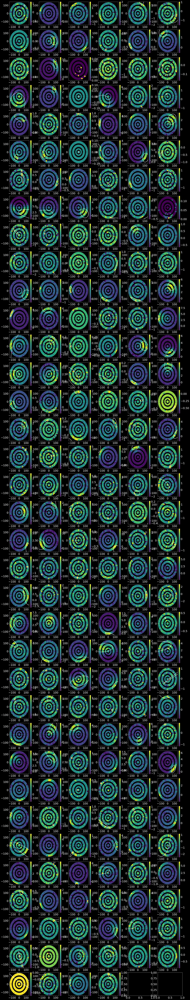

In [383]:
_,axs = plt.subplots(np.ceil(ncells/6).astype(int),6,figsize=(25,4*np.ceil(ncells/6).astype(int)))
axs = axs.flatten()
for j in range(ncells):
    plt.sca(axs[j])
    
    fr = psth[:,j].reshape((len(X), nreps, nt)).mean(axis=1) / np.diff(ti)[None, :]

    plt.scatter(X,Y, s=100, c=fr[:,1:].mean(axis=-1) - fr[:,0])

    _, stats = fit(X,Y, fr[:,1:].mean(axis=-1) - fr[:,0], bounds = ((-20,-300,-300, 10, 10, -np.pi, -10), (20, 300, 300, 300, 300, np.pi, 10)))

    ax = plt.gca()
    sc = EllipseCollection(offsets = stats[1:3], widths = 2*stats[3], heights = 2*stats[4], angles=-stats[5]/np.pi*180, units='xy', offset_transform=ax.transData, facecolors='None', edgecolors='w', linewidth=2)#, facecolors='None', edgecolors=sig)
    ax.add_collection(sc)

    plt.colorbar()

[ 1.33441262e+00 -2.50119889e+02 -4.97477764e+01  3.37696984e-01
  3.37696984e-01  0.00000000e+00  1.28205128e-02]


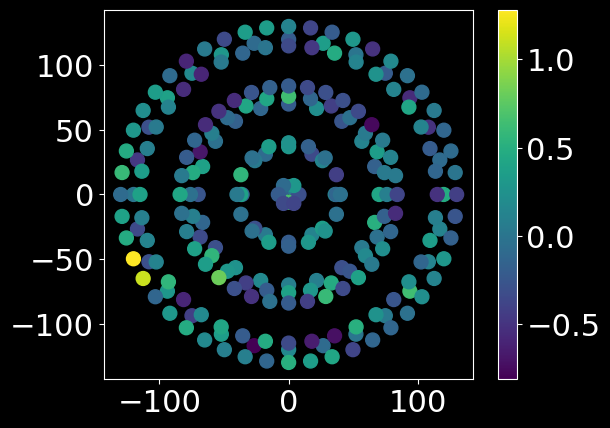

In [384]:
j = -30
fr = psth[:,j].reshape((len(X), nreps, nt)).mean(axis=1) / np.diff(ti)[None, :]
# plt.hist(fr[:,1:].mean(axis=-1) - fr[:,0])
# (fr[:,1:].mean(axis=-1) - fr[:,0]).std()

# fig, axs = plt.subplots(1,2,figsize=(15,7))
# ax = axs[0]
# plt.sca(ax)

plt.figure()
ax = plt.gca()


f, stats = fit(X,Y, fr[:,1:].mean(axis=-1) - fr[:,0], bounds = ((-20,-300,-300, 0, 0, -np.pi, -10), (20, 300, 300, 300, 300, np.pi, 10)))


# sc = EllipseCollection(offsets = (0,0), widths = 1, heights = 1, angles=0, units='xy', offset_transform=ax.transData, facecolors='None', edgecolors='w')#, facecolors='None', edgecolors=sig)
# sc.set_array(sig[:,0])


plt.scatter(X, Y, s=100, c = fr[:,1:].mean(axis=-1) - fr[:,0])
plt.axis('square')

# plt.xlim(-1,1)
# plt.ylim(-4500,1000)


plt.colorbar()

sc = EllipseCollection(offsets = stats[1:3], widths = 2*stats[3], heights = 2*stats[4], angles=-stats[5]/np.pi*180, units='xy', offset_transform=ax.transData, facecolors='None', edgecolors='w', linewidth=2)#, facecolors='None', edgecolors=sig)
ax.add_collection(sc)
sc = EllipseCollection(offsets = stats[1:3], widths = stats[3], heights = stats[4], angles=-stats[5]/np.pi*180, units='xy', offset_transform=ax.transData, facecolors='None', edgecolors='w', linewidth=2)#, facecolors='None', edgecolors=sig)
ax.add_collection(sc)


qX,qY = np.meshgrid(np.linspace(-150,150,301), np.linspace(-150,150,301))
qZ = gauss2((qX.flatten(), qY.flatten()), *stats)

# axs[1].imshow(qZ.reshape(qX.shape), extent=(-150, 150, -150, 150))
# axs[1].contour(qX,qY,qZ.reshape(qX.shape))
# plt.contour(qX,qY,qZ.reshape(qX.shape),colors='w')


print(stats) #amplitude, xo, yo, sigma_x, sigma_y, theta, offset



(-150.0, 150.0)

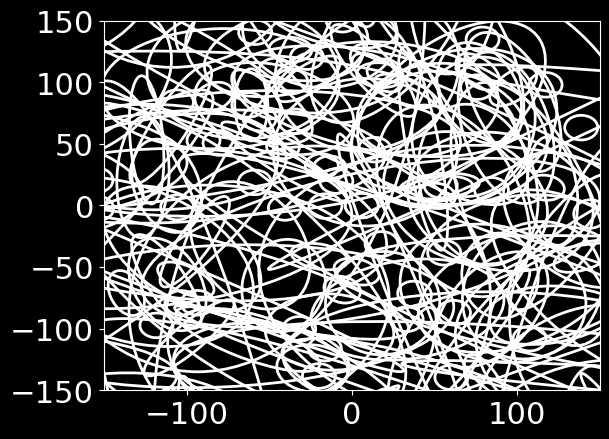

In [385]:
stats = np.zeros((ncells, 7))
for j in range(ncells):
    fr = psth[:,j].reshape((len(X), nreps, nt)).mean(axis=1) / np.diff(ti)[None, :]
    _, stats[j] = fit(X,Y, fr[:,1:].mean(axis=-1) - fr[:,0], bounds = ((-20,-300,-300, 10, 10, -np.pi, -10), (20, 300, 300, 300, 300, np.pi, 10)))

plt.figure()
ax = plt.gca()

sc = EllipseCollection(offsets = stats[:,1:3], widths = 2*stats[:,3], heights = 2*stats[:,4], angles=-stats[:,5]/np.pi*180, units='xy', offset_transform=ax.transData, facecolors='None', edgecolors='w', linewidth=2)#, facecolors='None', edgecolors=sig)
ax.add_collection(sc)
plt.xlim(-150,150)
plt.ylim(-150,150)



In [386]:
ui = np.tile(np.arange(len(X))[:,None],(1,nreps)).flatten()

cv = KFold(10, shuffle=True, random_state=0)


train, test = list(cv.split(psth, ui))[0]

# u = np.stack((X[ui],Y[ui[train]]), axis=1)
u = np.stack((X,Y), axis=0)

xtrain, xtest = psth[train], psth[test]
ytrain, ytest = np.stack((X[ui[train]],Y[ui[train]]), axis=1), np.stack((X[ui[test]],Y[ui[test]]), axis=1)
ltrain, ltest = ui[train], ui[test]

xtrain = xtrain.reshape((xtrain.shape[0],-1))
xtest = xtest.reshape((xtest.shape[0],-1))


In [387]:
width = 128
depth = 48

act = 'selu'
normalizer = layers.BatchNormalization

tmi = layers.Input(ncells * nt)
ffn = layers.Dense(width, activation=act)(tmi)
tmii = normalizer()(ffn)
ffn = tmii

for i in range(depth):
    ffn = layers.Dense(width, activation=act)(ffn)
    ffn = layers.Add()([tmii, ffn])
    ffn = normalizer()(ffn)

ffn = layers.Dense(2)(ffn)
mod = keras.Model(inputs=tmi, outputs = ffn)
mod.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 1070)]       0           []                               
                                                                                                  
 dense_226 (Dense)              (None, 128)          137088      ['input_9[0][0]']                
                                                                                                  
 batch_normalization_148 (Batch  (None, 128)         512         ['dense_226[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 dense_227 (Dense)              (None, 128)          16512       ['batch_normalization_148[0

In [388]:
mod.compile(
    loss = 'mse',
    
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    metrics=tf.keras.metrics.RootMeanSquaredError()
)
history = mod.fit(xtrain, ytrain, validation_data=(xtest,ytest), epochs=200, callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',restore_best_weights=True, patience=20, verbose=1))

Epoch 1/200
203/203 [==============================] - 24s 42ms/step - loss: 2872.9077 - root_mean_squared_error: 53.5995 - val_loss: 1393.9617 - val_root_mean_squared_error: 37.3358
Epoch 2/200
203/203 [==============================] - 7s 34ms/step - loss: 1167.7925 - root_mean_squared_error: 34.1730 - val_loss: 608.4948 - val_root_mean_squared_error: 24.6677
Epoch 3/200
203/203 [==============================] - 7s 35ms/step - loss: 640.8217 - root_mean_squared_error: 25.3145 - val_loss: 512.6657 - val_root_mean_squared_error: 22.6421
Epoch 4/200
203/203 [==============================] - 7s 35ms/step - loss: 557.9634 - root_mean_squared_error: 23.6213 - val_loss: 458.3725 - val_root_mean_squared_error: 21.4096
Epoch 5/200
203/203 [==============================] - 8s 38ms/step - loss: 486.1118 - root_mean_squared_error: 22.0479 - val_loss: 458.7053 - val_root_mean_squared_error: 21.4174
Epoch 6/200
203/203 [==============================] - 7s 36ms/step - loss: 423.4059 - root_mean

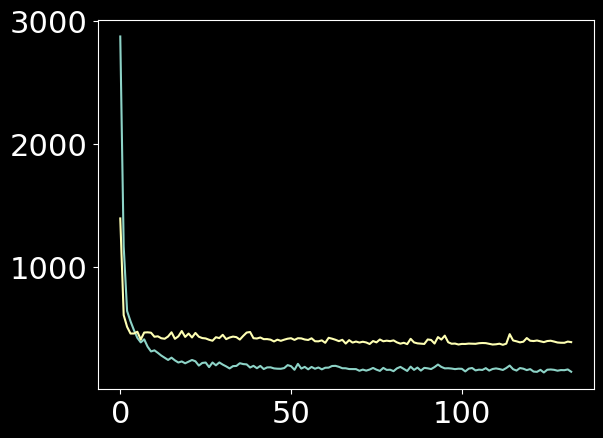

In [389]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

In [390]:
ptest = mod.predict(xtest)

23/23 [==============================] - 2s 11ms/step


C:\Users\zfj\AppData\Local\Temp\ipykernel_27456\903022753.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('inferno')
C:\Users\zfj\AppData\Local\Temp\ipykernel_27456\903022753.py:21: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, pad=.001)


(-150.26961025958082,
 145.25205592971253,
 -143.0771483725228,
 152.44451781677054)

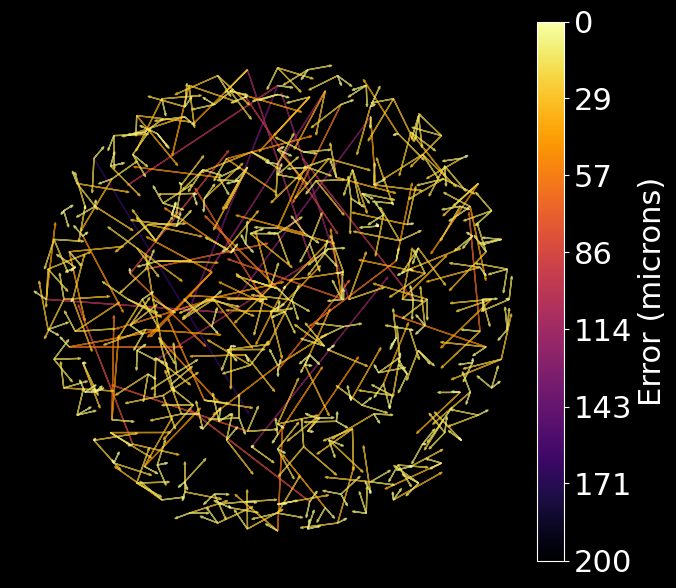

In [391]:
err = np.sqrt(np.sum((ptest - ytest)**2, axis=1))

clim = [0, 200]

cmap = mpl.cm.get_cmap('inferno')
norm = mpl.colors.Normalize(vmin=-clim[1], vmax=-clim[0])

plt.figure(figsize=(8,7))

ii = np.flip(np.argsort(err))

for k in range(len(ytest)):
    i = ii[k]
    # plt.quiver(ytest[:,0,0], ytest[:,0,1], 300*(ptest[:,0,0] - ytest[:,0,0]), 300*(ptest[:,0,1] - ytest[:,0,1]), angles='xy')
    plt.arrow(ytest[i,0], ytest[i,1], ptest[i,0] - ytest[i,0], ptest[i,1] - ytest[i,1], color=cmap(norm(-err[i])), length_includes_head=True, head_width=1, alpha=.7)
# ytest.squeeze().shape, ptest.shape


sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

cbar = plt.colorbar(sm, pad=.001)
cbar.set_label('Error (microns)')
cbar.ax.set_yticks(np.linspace(-clim[1],-clim[0],8))
cbar.ax.set_yticklabels([f"{abs(i):0.0f}" for i in np.linspace(-clim[1],-clim[0],8)])

plt.axis('square')
plt.axis('off')

19.87698993978771


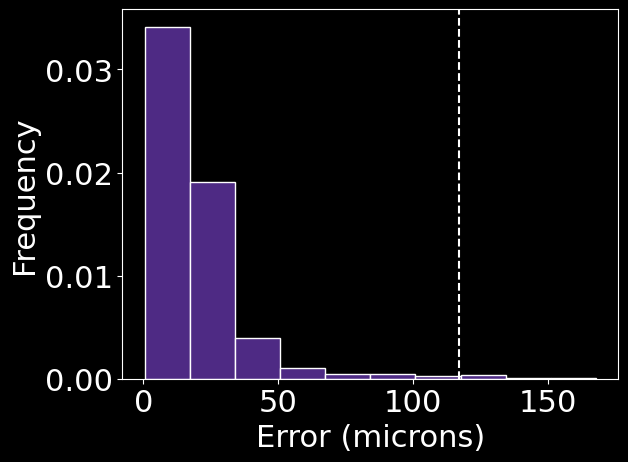

In [392]:
err_b = np.empty(1000)
for k in range(1000):
    err_b[k]= np.sqrt(np.sum((np.random.permutation(ptest)[:,:] - ytest[:,:])**2, axis=1)).mean()

plt.hist(err, density=True, color='#4E2A84',edgecolor='w')
plt.axvline(np.percentile(err_b,.05),0,1,color='w',linestyle='--')
plt.xlabel('Error (microns)')
plt.ylabel('Frequency')
print(err.mean())

In [393]:
def get_thresh(y,p, do_plotting = False, err=True):
    from scipy.optimize import curve_fit
    def logifunc(x,k):
        return 1. / (1 + np.exp(-k*x))


    N = len(y)

    i = np.triu_indices(N, 1)
    vyx = (y[:,None,0] - y[None,:,0])[i]
    vpx = (p[:,None,0] - p[None,:,0])[i]    
    vyy = (y[:,None,1] - y[None,:,1])[i]
    vpy = (p[:,None,1] - p[None,:,1])[i]

    d = np.sqrt(vyx**2 + vyy**2)
    b = ((vyx * vpx) + (vyy * vpy)) > 0

    k, _ = curve_fit(logifunc, d, b, p0=0.027)

    if do_plotting:
        di, ji = np.unique(np.round(d*100)/100, return_inverse=True)
        ndists = len(di)

        bsi = np.zeros(ndists)
        bi = np.zeros(ndists)

        for i in range(1,ndists):
            bi[i] = np.nanmean(b[ji==i])
            bsi[i] = np.nanstd(b[ji==i])/np.sqrt(np.count_nonzero(ji==i))

        di[0] = 0
        bi[0] = .5

        if err:
            plt.errorbar(di,bi,bsi, linestyle='none', marker='o', capsize=3, capthick=3)
        else:
            plt.scatter(di, bi)

        ei = np.linspace(0, d.max(), 100)
        e = logifunc(ei, k.mean()) 
        plt.plot(ei,e)

        xl = plt.xlim()
        yl = plt.ylim()
        plt.cla()

        th = np.log(1/3)/-k.mean()
        
        if err:
            plt.errorbar(di,bi,bsi, linestyle='none', marker='o', color="#4E2A84", capsize=3, capthick=3, zorder=0)
        else:
            plt.scatter(di, bi, color="#4E2A84", zorder=0)


        plt.vlines(th,yl[0],.75,color='w', zorder=10)
        plt.hlines(.75, xl[0], th, zorder=10)        
        plt.plot(ei, e, 'w', zorder=10)
        

        plt.xlim(xl)
        plt.ylim(yl)
        # print(th)

        plt.xlabel('Distance (microns)')
        plt.ylabel('Discrimination accuracy')


    return np.log(1/3)/-k

array([16.04742742])

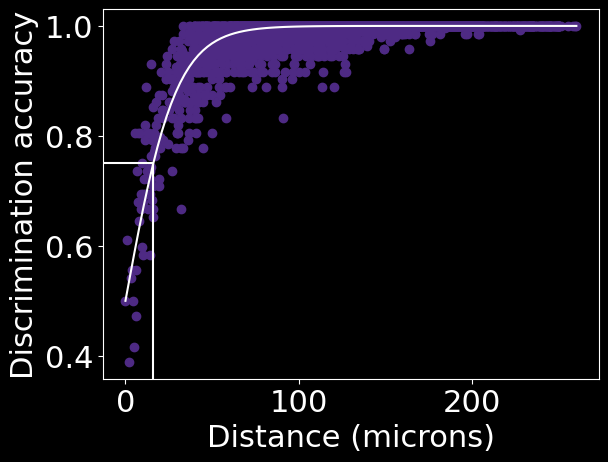

In [394]:
get_thresh(ytest, ptest, do_plotting=True, err=False)

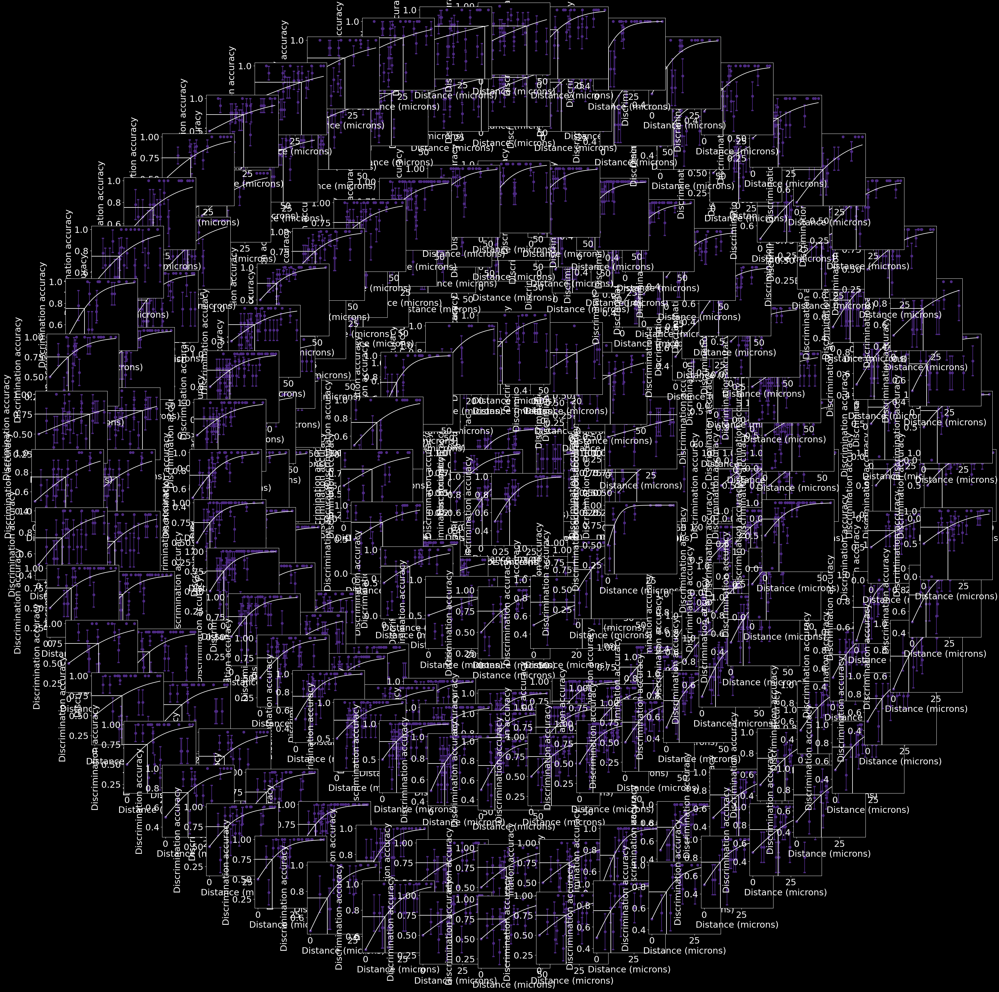

In [395]:
plt.figure(figsize=(25,25))

udist = np.sqrt(((u.T[:,None,:] - u.T[None,:,:])**2).sum(axis=-1))
th_map = np.zeros(u.shape[1])
for i,c in enumerate(u.T):
    j = np.argwhere(udist[i] < 30.1)
    
    k = np.isin(ui[test], j)
    # print(np.count_nonzero(k))

    t = (c + 105) / 210
    plt.axes([*t, .1, .1])

    th_map[i] = get_thresh(ytest[k], ptest[k], do_plotting=True)
    # th_map[i] = get_thresh(ytest[k], pstest[k], do_plotting=True)
    
th_map[th_map < 0] = np.infty

C:\Users\zfj\AppData\Local\Temp\ipykernel_27456\1314061211.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = mpl.cm.get_cmap('inferno')
C:\Users\zfj\AppData\Local\Temp\ipykernel_27456\1314061211.py:15: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, pad=.001)


3.693187850768369 49.71717536744452


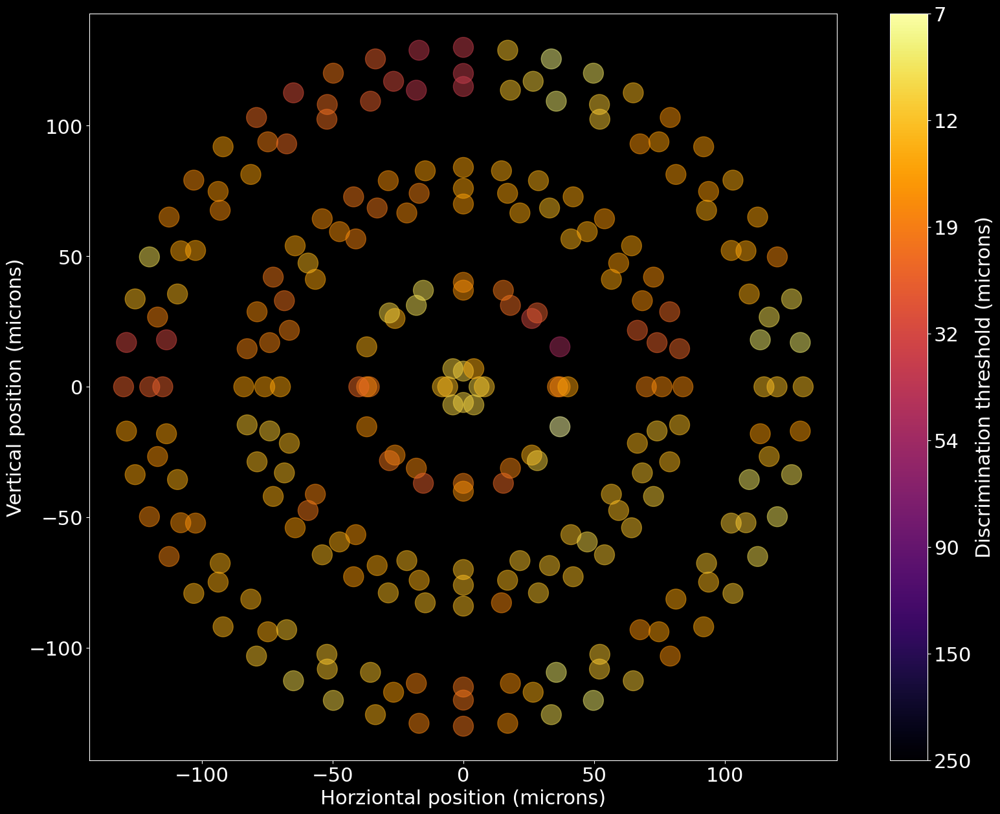

In [396]:
mpl.rcParams.update({'font.size': 22})


clim = [np.log10(3), np.log10(250)]

cmap = mpl.cm.get_cmap('inferno')
norm = mpl.colors.Normalize(vmin=-clim[1], vmax=-clim[0])

plt.figure(figsize=(20,15))
# s = plt.scatter(*u, s=500, c='none', edgecolors = cmap(norm(-np.log10(th_map))), linewidths=1)#, edgecolors='face')
s = plt.scatter(*u, s=500, c=cmap(norm(-np.log10(th_map))), alpha=.5)#, edgecolors='face')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

cbar = plt.colorbar(sm, pad=.001)
cbar.set_label('Discrimination threshold (microns)')
cbar.ax.set_yticks(np.linspace(-clim[1],-clim[0],8))
cbar.ax.set_yticklabels([f"{10**abs(i):0.0f}" for i in np.linspace(-clim[1],-clim[0],8)])

plt.xlabel('Horziontal position (microns)')
plt.ylabel('Vertical position (microns)')

plt.axis('square')

print(th_map.min(), th_map[~np.isinf(th_map)].max())
plt.show()

# nosie corr: 9.418774481733289 2561.0183912263437
# no noise corr: 12.348962823119741 254.42476311805797


In [235]:
xtest.shape, xtrain.shape

((720, 600), (6480, 600))